In [1]:
@show VERSION
@time using DifferentialEquations
@time using Plots
@time using ProgressMeter
@time using Parameters

VERSION = v"1.7.0-DEV.706"
  9.260363 seconds (13.40 M allocations: 1.095 GiB, 3.58% gc time)
  6.533392 seconds (7.26 M allocations: 528.110 MiB, 13.91% gc time)
  0.010791 seconds (7.06 k allocations: 521.172 KiB)
  0.000464 seconds (249 allocations: 16.359 KiB)


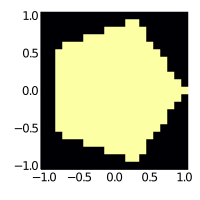

In [2]:
⪅(x, y) = x < y || x ≈ y

function isin_ngon(n, R, x, y)
    α = 2π/n
    θ = mod(angle(x + im*y), α)
    r = √(x^2 + y^2) / R
    X, Y = r*cos(θ), r*sin(θ)
    (1 - cos(α))*Y ⪅ sin(α)*(1 - X)
end

isin_unit_pentagon(x, y) = isin_ngon(5, 1, x, y)

x = -1:0.1:1
y = -1:0.1:1
D = isin_unit_pentagon.(x, y')
heatmap(x, y, D'; colorbar=false, size=(200, 200))

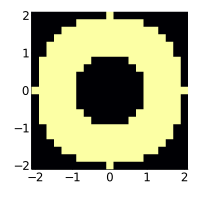

In [3]:
⪅(x, y) = x < y || x ≈ y
isin_annulus(x, y; r=1, R=2) = r^2 ⪅ x^2 + y^2 ⪅ R^2

x = -2:0.2:2
y = -2:0.2:2
D = isin_annulus.(x, y')
heatmap(x, y, D'; colorbar=false, size=(200, 200))

In [4]:
module My

using Parameters: @unpack

struct Param{TX, TY, TH, TV, TE, TV_dic}
    x::TX
    y::TY
    h⁻²::TH
    V::TV
    E::TE
    V_dic::TV_dic
end

Base.length(p::Param) = length(p.V)
Base.size(p::Param) = (length(p.x), length(p.y))

mystep(x::AbstractVector) = x[2] - x[1]
mystep(x::StepRangeLen) = step(x)

function Param(isin_func, x::AbstractVector, y::AbstractVector)
    @assert mystep(x) == mystep(y)
    h⁻² = 1/mystep(x)^2
    I, J = eachindex(x), eachindex(y)
    D = isin_func.(x, y')
    V = Tuple{Int64, Int64}[]
    E_mat = [Tuple{Int64, Int64}[] for i in I, j in J]
    B_mat = zeros(Int64, length(I), length(J))
    for j in J, i in I
        if D[i, j]
            push!(V, (i, j))
            for q in (-1, 1), p in (-1, 1)
                if i+p in I && j+q in J && D[i+p, j+q]
                    push!(E_mat[i, j], (i+p, j+q))
                end
            end
        end
    end
    V_dic = Dict(V[k] => k for k in eachindex(V))
    E = [getindex.(Ref(V_dic), E_mat[V[k]...]) for k in eachindex(V)]
    Param(x, y, h⁻², V, E, V_dic)
end

function vec2mat!(p::Param, u, U)
    @unpack V = p
    for k in eachindex(V)
        U[V[k]...] = u[k]
    end
    U
end
    
function vec2mat(p::Param, u; default_value=NaN)
    U = fill(eltype(u)(default_value), size(p))
    vec2mat!(p, u, U)
end

function mat2vec!(p::Param, U, u)
    @unpack V_dic = p
    for t in keys(V_dic)
        u[V_dic[t]] = U[t...]
    end
    u
end

function mat2vec(p::Param, U)
    u = similar(eltype(U)[], length(p))
    mat2vec!(p, U, u)
end

end

x = -2:0.4:2
y = -2:0.4:2
p = My.Param(isin_annulus, x, y)

@unpack h⁻², V, E = p
@show h⁻²
@show V[20]
@show E[20]
@show V[E[20]]

u0 = ones(length(V))
U0 = My.vec2mat(p, u0; default_value=0)
@show My.mat2vec(p, U0) == u0
U0'

h⁻² = 6.249999999999999
V[20] = (4, 4)
E[20] = [10, 12, 25]
V[E[20]] = [(3, 3), (5, 3), (3, 5)]
My.mat2vec(p, U0) == u0 = true


11×11 adjoint(::Matrix{Float64}) with eltype Float64:
 0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  0.0  0.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  0.0
 0.0  1.0  1.0  1.0  0.0  0.0  0.0  1.0  1.0  1.0  0.0
 0.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0
 1.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0
 0.0  1.0  1.0  0.0  0.0  0.0  0.0  0.0  1.0  1.0  0.0
 0.0  1.0  1.0  1.0  0.0  0.0  0.0  1.0  1.0  1.0  0.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  0.0
 0.0  0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0

In [5]:
function anim_sol(sol; L=201, fps=20, fn="tmp.gif", color=cgrad(:default), kwargs...)
    @unpack prob, u = sol
    @unpack tspan, p = prob
    @unpack x, y = p
    umin = minimum(minimum(u.x[2]) for u in u)
    umax = maximum(maximum(u.x[2]) for u in u)
    ts = range(tspan...; length=L) |> r -> [fill(r[1], 20); r; fill(r[end], 20)]
    prog = Progress(length(ts), 0)
    anim = @animate for t in ts
        U = My.vec2mat(p, sol(t).x[2])
        surface(x, y, U'; zlim=(umin, umax), colorbar=false, color)
        title!("t = $(round(t, digits=1))"; titlefontsize=12)
        plot!(; kwargs...)
        next!(prog)
    end
    gif(anim, fn; fps)
end

anim_sol (generic function with 1 method)

In [6]:
f!(du, v, u, p, t) = @. du = v

function g_neumanｎ!(dv, v, u, p, t)
    @unpack h⁻², E = p
    @inbounds for k in eachindex(dv)
        dv[k] = h⁻² * sum(u[l] - u[k] for l in E[k])
    end
end

x = y = range(-2, 2; length=401)
p = My.Param(isin_annulus, x, y)
@show length(p)

f(x, y) = exp(-((x-1.5)^2 + y^2)/(2*0.1^2))
U0 = f.(x, y')
V0 = zero(U0)

u0 = My.mat2vec(p, U0)
v0 = My.mat2vec(p, V0)
tspan = (0.0, 10.0)

@time prob = DynamicalODEProblem(g_neumanｎ!, f!, v0, u0, tspan, p)
@time sol_n = solve(prob);

length(p) = 94232
  0.343125 seconds (727.45 k allocations: 66.381 MiB, 8.82% gc time, 96.66% compilation time)
 28.819882 seconds (22.83 M allocations: 9.807 GiB, 10.84% gc time)


Progress: 100%|█████████████████████████████████████████| Time: 0:00:329mmmmmm
┌ Info: Saved animation to 
│   fn = C:\Users\genkuroki\OneDrive\Math\Math0052\wave eq on annulus neumann CMRmap.gif
└ @ Plots C:\Users\genkuroki\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\genkuroki\\OneDrive\\Math\\Math0052\\wave eq on annulus neumann CMRmap.gif")
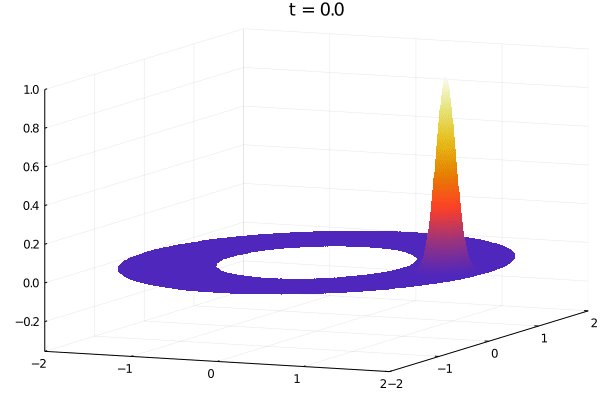

In [7]:
anim_sol(sol_n; fps=20, fn="wave eq on annulus neumann CMRmap.gif", color=:CMRmap)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:26
┌ Info: Saved animation to 
│   fn = C:\Users\genkuroki\OneDrive\Math\Math0052\wave eq on annulus neumann prism.gif
└ @ Plots C:\Users\genkuroki\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\genkuroki\\OneDrive\\Math\\Math0052\\wave eq on annulus neumann prism.gif")
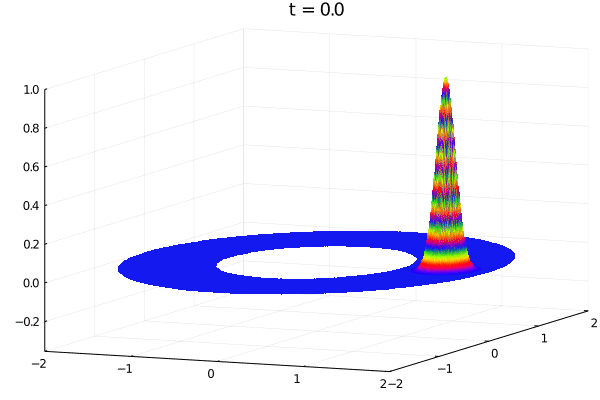

In [8]:
anim_sol(sol_n; fps=20, fn="wave eq on annulus neumann prism.gif", color=:prism)

In [9]:
f!(du, v, u, p, t) = @. du = v

function g_dirichlet!(dv, v, u, p, t)
    @unpack h⁻², E = p
    @inbounds for k in eachindex(dv)
        dv[k] = h⁻² * (sum(u[l] - u[k] for l in E[k]) - (4 - length(E[k])) * u[k])
    end
end

x = y = range(-2, 2; length=401)
p = My.Param(isin_annulus, x, y)
@show length(p)

f(x, y) = exp(-((x-1.5)^2 + y^2)/(2*0.1^2))
U0 = f.(x, y')
V0 = zero(U0)

u0 = My.mat2vec(p, U0)
v0 = My.mat2vec(p, V0)
tspan = (0.0, 10.0)

@time prob = DynamicalODEProblem(g_dirichlet!, f!, v0, u0, tspan, p)
@time sol_d = solve(prob);

length(p) = 94232
  0.038385 seconds (35.14 k allocations: 2.501 MiB, 90.61% compilation time)
 36.716107 seconds (6.55 M allocations: 9.238 GiB, 11.70% gc time)


Progress: 100%|█████████████████████████████████████████| Time: 0:00:27
┌ Info: Saved animation to 
│   fn = C:\Users\genkuroki\OneDrive\Math\Math0052\wave eq on annulus dirichlet CMRmap.gif
└ @ Plots C:\Users\genkuroki\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\genkuroki\\OneDrive\\Math\\Math0052\\wave eq on annulus dirichlet CMRmap.gif")
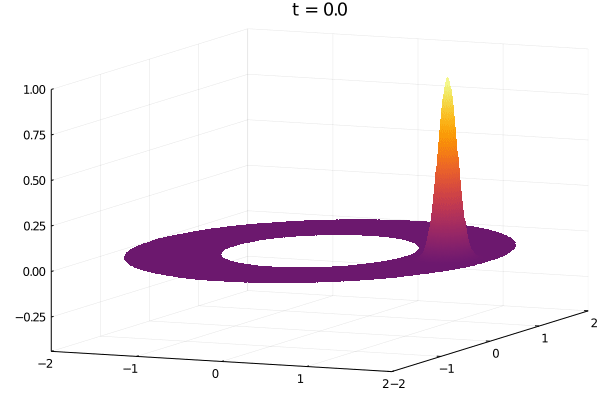

In [10]:
anim_sol(sol_d; fn="wave eq on annulus dirichlet CMRmap.gif")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:25
┌ Info: Saved animation to 
│   fn = C:\Users\genkuroki\OneDrive\Math\Math0052\wave eq on annulus dirichlet prism.gif
└ @ Plots C:\Users\genkuroki\.julia\packages\Plots\z5Msu\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\genkuroki\\OneDrive\\Math\\Math0052\\wave eq on annulus dirichlet prism.gif")
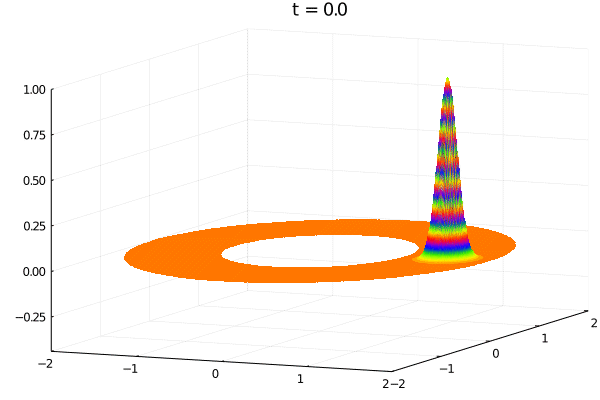

In [11]:
anim_sol(sol_d; fn="wave eq on annulus dirichlet prism.gif", color=:prism)